In [9]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

### 1. vẽ biểu đồ cột cho neighborhood group


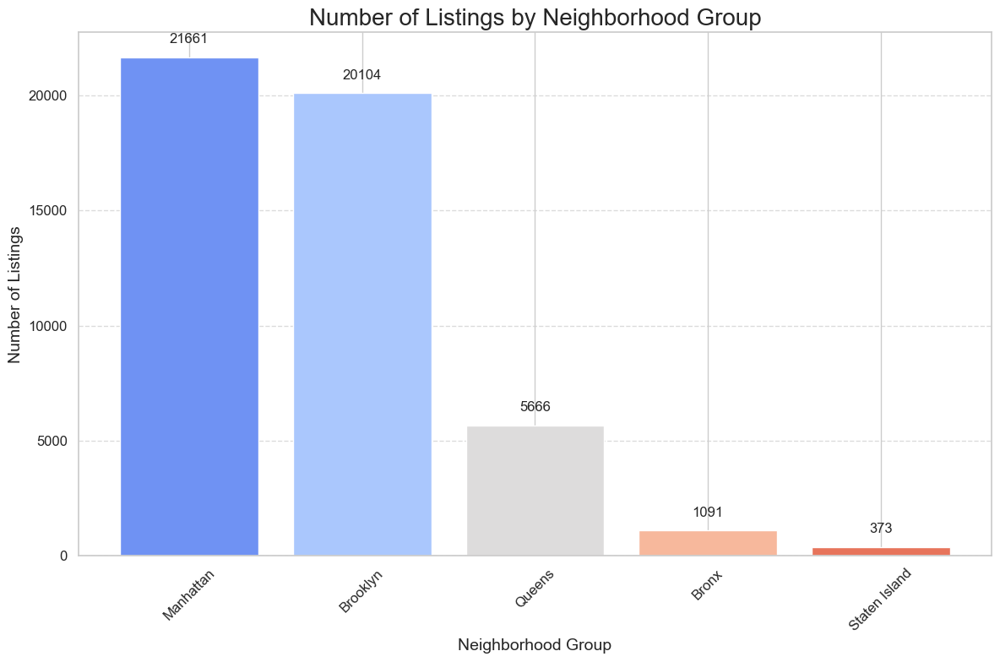

In [10]:
df  = pd.read_csv("./data/AB_NYC_2019.csv")
neighborhood_group_counts = df['neighbourhood_group'].value_counts()

sns.set(style="whitegrid")
colors = sns.color_palette("coolwarm", len(neighborhood_group_counts))

plt.figure(figsize=(12, 8))
bars = plt.bar(neighborhood_group_counts.index,
               neighborhood_group_counts.values, color=colors)


plt.title('Number of Listings by Neighborhood Group', fontsize=20)
plt.xlabel('Neighborhood Group', fontsize=14)
plt.ylabel('Number of Listings', fontsize=14)
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)


plt.grid(axis='y', linestyle='--', alpha=0.7)


for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval + 500,
             int(yval), ha='center', va='bottom', fontsize=12)


plt.tight_layout()
plt.show()
plt.show()

### 2. tạo histogram cho neighbourhood

C:\Users\ACER\AppData\Local\Temp\ipykernel_15652\1358772371.py:4: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  hist_plot = sns.histplot(df['neighbourhood'],


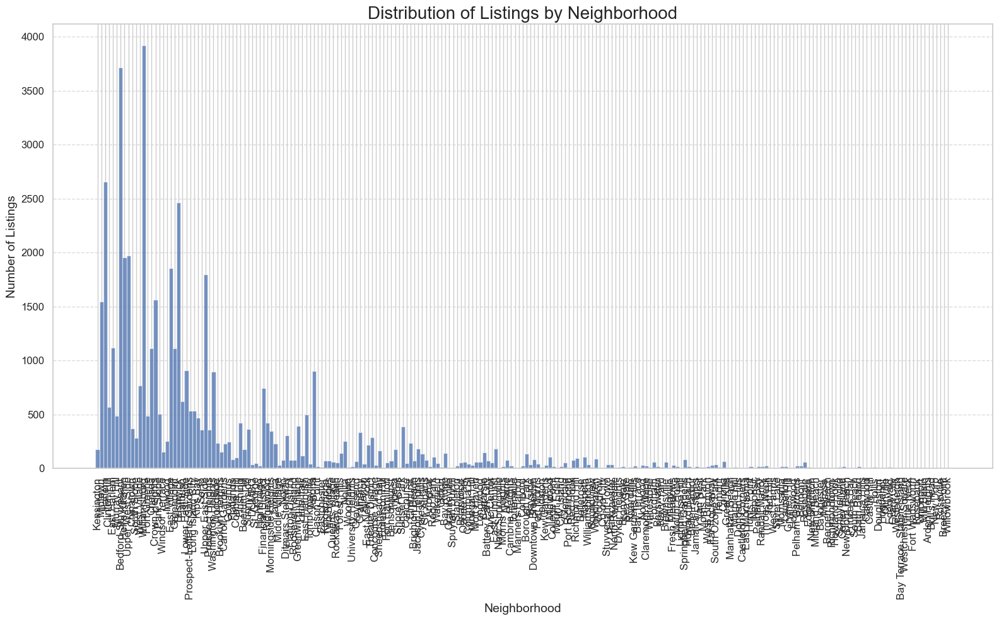

In [12]:
sns.set(style="whitegrid")

plt.figure(figsize=(16, 10))
hist_plot = sns.histplot(df['neighbourhood'],
                         bins=30, kde=False, palette='viridis')

plt.title('Distribution of Listings by Neighborhood', fontsize=20)
plt.xlabel('Neighborhood', fontsize=14)
plt.ylabel('Number of Listings', fontsize=14)
plt.xticks(rotation=90, fontsize=12)
plt.yticks(fontsize=12)

plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

### 3. Biểu diễn mối liên hệ giữa neighbourgroup và Availability của các phòng

C:\Users\ACER\AppData\Local\Temp\ipykernel_15652\1534848163.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box_plot = sns.boxplot(x='neighbourhood_group',
C:\Users\ACER\AppData\Local\Temp\ipykernel_15652\1534848163.py:5: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  box_plot = sns.boxplot(x='neighbourhood_group',


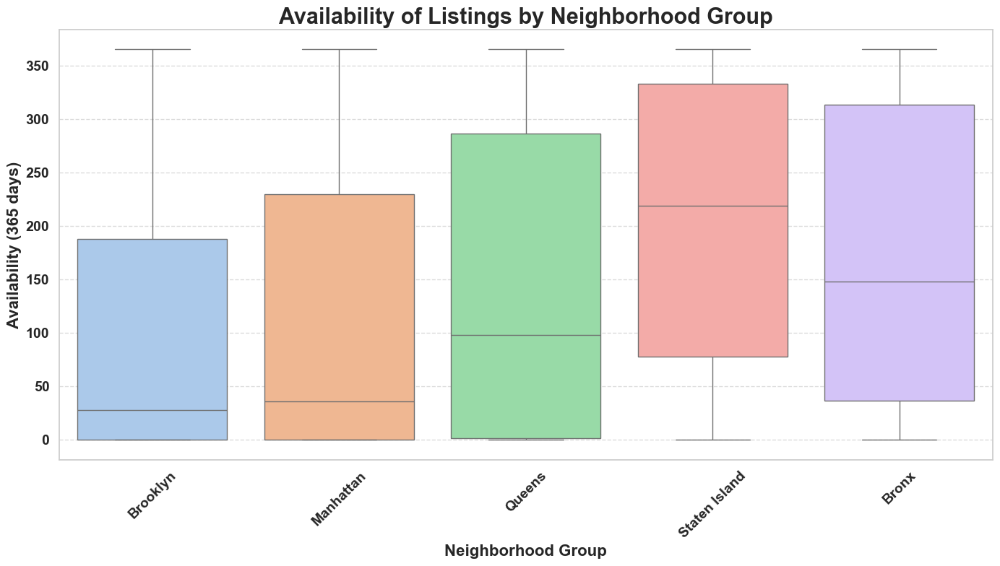

In [16]:
sns.set(style="whitegrid")
palette = sns.color_palette("pastel")

plt.figure(figsize=(14, 8))
box_plot = sns.boxplot(x='neighbourhood_group',
                       y='availability_365', data=df, palette=palette)

plt.title('Availability of Listings by Neighborhood Group',
          fontsize=22, fontweight='bold')
plt.xlabel('Neighborhood Group', fontsize=16, fontweight='bold')
plt.ylabel('Availability (365 days)', fontsize=16, fontweight='bold')
plt.xticks(rotation=45, fontsize=14, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')

plt.grid(axis='y', linestyle='--', alpha=0.7)

for patch in box_plot.artists:
    r, g, b, a = patch.get_facecolor()
    patch.set_facecolor((r, g, b, .5))

plt.tight_layout()
plt.show()

### 4. Vẽ bản đồ (scatter plot) của neighborhood dựa theo tọa độ lat lon

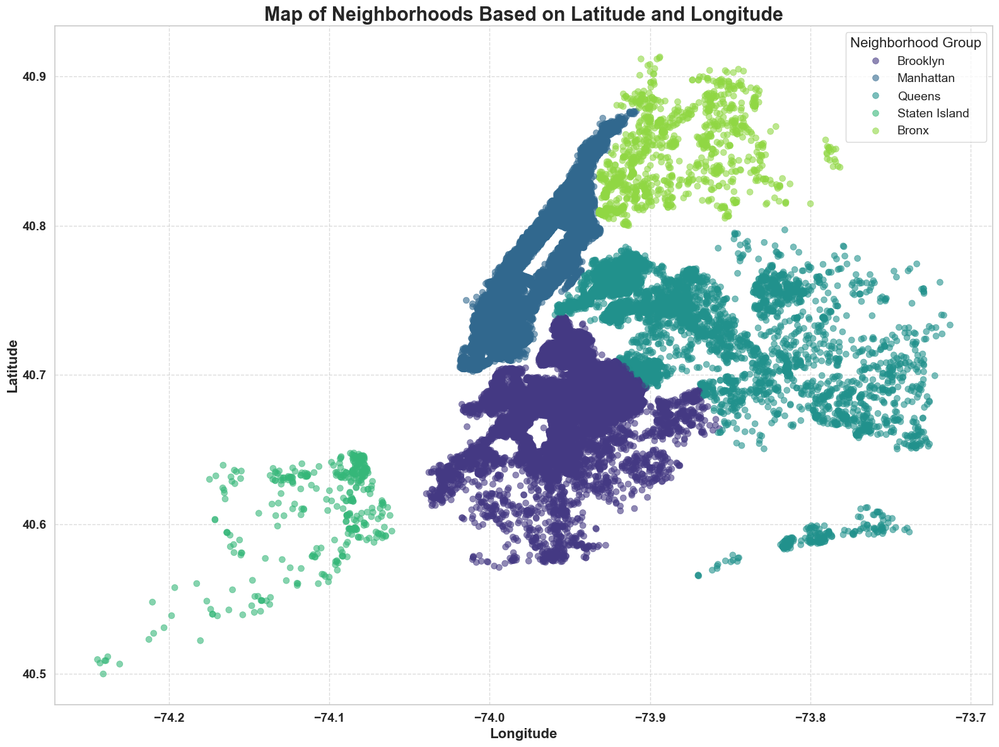

In [18]:
sns.set(style="whitegrid")
palette = sns.color_palette("viridis", as_cmap=True)
plt.figure(figsize=(16, 12))
scatter_plot = sns.scatterplot(x='longitude', y='latitude', hue='neighbourhood_group',
                               palette='viridis', data=df, alpha=0.6, s=50, edgecolor=None)

plt.title('Map of Neighborhoods Based on Latitude and Longitude',
          fontsize=22, fontweight='bold')
plt.xlabel('Longitude', fontsize=16, fontweight='bold')
plt.ylabel('Latitude', fontsize=16, fontweight='bold')
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')

plt.legend(title='Neighborhood Group', fontsize=14,
           title_fontsize=16, loc='upper right')

plt.grid(linestyle='--', alpha=0.7)

plt.tight_layout()

plt.show()

### 5. Sử dụng heatmap để biểu diễn mối quan hệ (correlation) giữa tất cả các thuộc tính trong dữ liệu

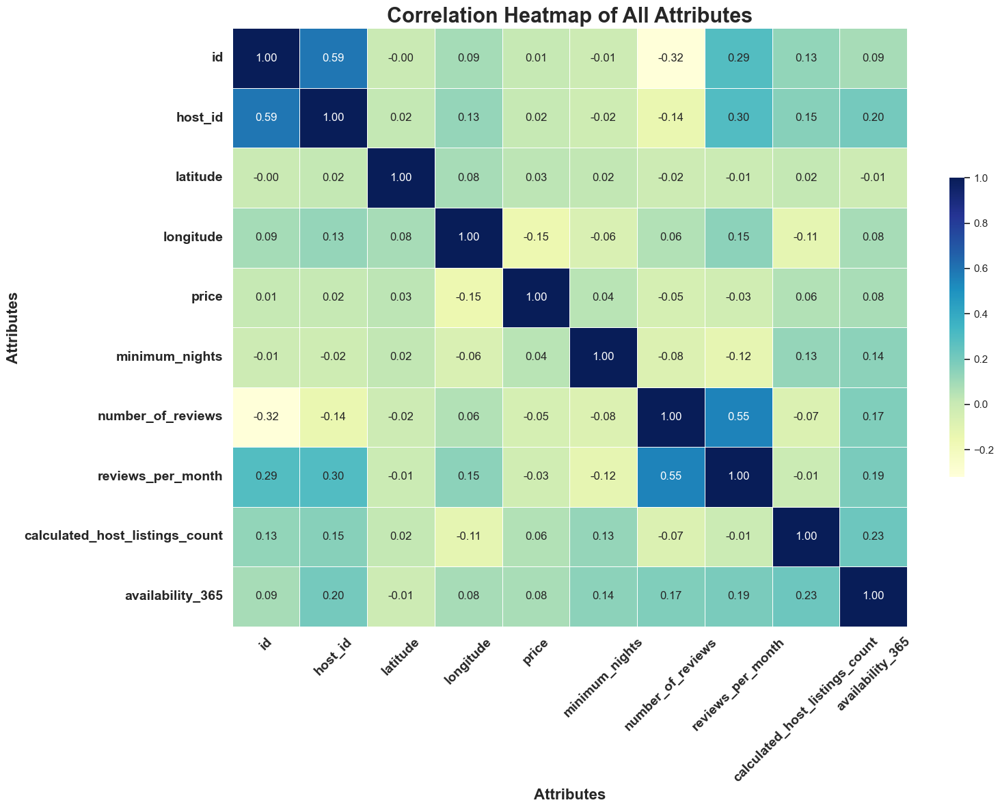

In [19]:
numeric_data = df.select_dtypes(include=['float64', 'int64'])

correlation_matrix = numeric_data.corr()

sns.set(style="white")

plt.figure(figsize=(16, 12))
heatmap = sns.heatmap(correlation_matrix, annot=True, fmt='.2f',
                      cmap='YlGnBu', linewidths=0.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap of All Attributes',
          fontsize=22, fontweight='bold')
plt.xlabel('Attributes', fontsize=16, fontweight='bold')
plt.ylabel('Attributes', fontsize=16, fontweight='bold')
plt.xticks(fontsize=14, fontweight='bold', rotation=45)
plt.yticks(fontsize=14, fontweight='bold', rotation=0)

plt.tight_layout()

plt.show()

### Câu nâng cao:
### 1. Sử dụng plotly để biểu diễn dữ liệu giá phòng trên bản đồ như mẫu ở slide trang 12 (có thể bấm vào bản đồ để xem giá nhà tại từng điểm)

In [22]:
import plotly.express as px
fig = px.scatter_mapbox(df,
                        lat="latitude",
                        lon="longitude",
                        color="price",
                        size="price",
                        hover_name="name",
                        hover_data=["neighbourhood", "price"],
                        color_continuous_scale=px.colors.sequential.Viridis,
                        size_max=15,
                        zoom=10,
                        title="Room Prices in NYC")

fig.update_layout(mapbox_style="carto-positron",
                  title_font=dict(size=24, family='Arial', color='black'),
                  title_x=0.5,
                  margin=dict(l=0, r=0, t=50, b=0),
                  coloraxis_colorbar=dict(title="Price",
                                          thicknessmode="pixels", thickness=20,
                                          lenmode="pixels", len=300,
                                          yanchor="top", y=1, xanchor="left", x=0.01,
                                          ticks="outside"))

fig.show()